# Minneapolis Crime Data Exploration & Analysis
* Author: Jay Bennett (https://www.github.com/jaybenne2001)
* Created on: September 4, 2021
* Description: Data analysis, exploration & visualization on crime incidents in Minneapolis

## Minneapolis Incidents Datasets

This dataset contains incidents derived from Minneapolis Crime Incident Reporting system. The data ranges from 1/1/2020 to 09/04/2021. However, there are two different structures. From 2010 through May of 2018 the
Computer Assisted Police Records System (CAPRS) was used then in June of 2018 it was replaced by the PIMS (Police Incident Management System).


### Data Fields
- **Dates** - timestamp of the crime incident
- **Offense** - Offense of the crime incident (only in train.csv). This is the target variable you are going to predict.
- **Descript** - detailed description of the crime incident (only in train.csv)
- **DayOfWeek** - the day of the week
- **Neighborhood** - name of the Police Department District
- **Resolution** - how the crime incident was resolved (only in train.csv)
- **Address** - the approximate street address of the crime incident 
- **X** - Longitude
- **Y** - Latitude


### Hypothesis 
My goal was to build a predictive model for two main reasons: 
    1)	to help Minneapolis citizens make better decisions regarding their personal safety 
    2)	to help law enforcement more effectively allocate resources. 

My model will provide an estimated price given a set of independent variables. 

We brainstormed a list of questions to drive our hypothesis and body of work. 

1.	Can a model be developed to accurately predict the price of the wine given the variety, vintage, rating, region, and description?
If so, what are the business/consumer implications?

How can this model be utilized? 

2.	What can be gleaned about the wine industry and consumer trends through visualization of this data? Which regions/vintages are favored? What are the “best buys” in wine? How is the industry changing/evolving? 

3.	Can we determine if there is pricing or reviewer bias in the data? 


### Field Descriptions - PIMS (06/01/2018 to present)

- **BeginDate** Date incident began. Time in the field is UTC not local, so a separate column is created for accurate time information.
- **Time** Begin date time field.
- **CCN** A concatenation of the 4 digit year in which the incident was created, followed by a dash and then a 6 digit number of sequence for the agency. The MP at the beginning signifies a report taken by Minneapolis Police. This is used because Minneapolis shares the record management system with the University of 
- **Minnesota Police ControlNbr** A unique identifier for case.
- **Offense** Code of criminal act reported.
- **Description** Description of the criminal code of incident.
- **EnteredDate** The timestamp of when the incident was created in the system.
- **GBSID** The anonymized street centerline ID.
- **LastChanged** Date the record was last altered in system.
- **LastUpdateDate** Date the record was last moved to open data.
- **Lat** The anonymized latitude of the incident.
- **Long** The anonymized longitude of the incident.
- **Neighborhood** The neighborhood of the incident. Note that occasionally due to the anonymization process, if a point is on the boundary of a neighborhood, it may fall into either neighborhood.
- **OBJECTID** A unique identifier for open data portal.
- **Precinct** The police precinct of the incident. Note that occasionally due to the anonymization process, if a point is on the boundary of a precinct, it may fall into either precinct.
- **PublicAddress** Address of incident anonymized to the block.
- **ReportedDate** Date incident is reported to police.

- **Categoy** = UCRCode: Code that signifies the type of crime that was committed. (1 = MURDER3 = RAPE 4 = ROBBERY 5 = ASSAULT 6 = BURGLARY 7 = LARCENY 8 = AUTO THEFT 10 = ARSON)

### Field Descriptions 

- CAPRS (01/01/2010 to present) *The system is 28 years old but 2010 is the oldest data pulbished on https://opendata.minneapolismn.gov/
-
- **PublicAddress** (type: esriFieldTypeString, alias: PublicAddress, SQL Type: sqlTypeOther, length: 100, nullable: true, editable: true)
- **ControlNbr** (type: esriFieldTypeInteger, alias: ControlNbr, SQL Type: sqlTypeOther, nullable: false, editable: true)
- **CCN** (type: esriFieldTypeString, alias: CCN, SQL Type: sqlTypeOther, length: 28, nullable: true, editable: true)
- **Precinct** (type: esriFieldTypeString, alias: Precinct, SQL Type: sqlTypeOther, length: 2, nullable: true, editable: true)
- **ReportedDate** (type: esriFieldTypeDate, alias: ReportedDate, SQL Type: sqlTypeOther, length: 8, nullable: true, editable: true)
- **BeginDate** (type: esriFieldTypeDate, alias: BeginDate, SQL Type: sqlTypeOther, length: 8, nullable: true, editable: true)
- **Time** (type: esriFieldTypeString, alias: Time, SQL Type: sqlTypeOther, length: 20, nullable: true, editable: true)
- **Offense** (type: esriFieldTypeString, alias: Offense, SQL Type: sqlTypeOther, length: 20, nullable: false, editable: true)
- **Description** (type: esriFieldTypeString, alias: Description, SQL Type: sqlTypeOther, length: 65, nullable: true, editable: true)
- **UCRCode** (type: esriFieldTypeString, alias: UCRCode, SQL Type: sqlTypeOther, length: 3, nullable: true, editable: true)
- **EnteredDate** (type: esriFieldTypeDate, alias: EnteredDate, SQL Type: sqlTypeOther, length: 8, nullable: true, editable: true)
- **GBSID** (type: esriFieldTypeDouble, alias: GBSID, SQL Type: sqlTypeOther, nullable: true, editable: true)
- **Lat** (type: esriFieldTypeDouble, alias: Lat, SQL Type: sqlTypeOther, nullable: true, editable: true)
- **Long** (type: esriFieldTypeDouble, alias: Long, SQL Type: sqlTypeOther, nullable: true, editable: true)
- **X** (type: esriFieldTypeDouble, alias: X, SQL Type: sqlTypeOther, nullable: true, editable: true)
- **Y** (type: esriFieldTypeDouble, alias: Y, SQL Type: sqlTypeOther, nullable: true, editable: true)
- **Neighborhood** (type: esriFieldTypeString, alias: Neighborhood, SQL Type: sqlTypeOther, length: 32, nullable: true, editable: true)
- **LastChanged** (type: esriFieldTypeDate, alias: LastChanged, SQL Type: sqlTypeOther, length: 8, nullable: true, editable: true)
- **LastUpdateDate** (type: esriFieldTypeDate, alias: LastUpdateDate, SQL Type: sqlTypeOther, length: 8, nullable: true, editable: true)
- **ESRI_OID** (type: esriFieldTypeOID, alias: ESRI_OID, SQL Type: sqlTypeOther, length: 0, nullable: false, editable: false)

Code Reference:
https://github.com/k-chuang/kaggle-sf-crime

In [2]:
# Import necessary packages
import os
import warnings
import pandas as pd
import numpy as np
import folium
from folium import plugins
from folium.plugins import MarkerCluster
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

warnings.filterwarnings('ignore')
%matplotlib inline

# Set pandas's max row display
pd.set_option('display.max_row', 1000)

# Set pandas's max column width to 50
pd.set_option('display.max_columns', 50)

# Set Seaborn style to default
sns.set_style('darkgrid')


title_font_size = 14
x_axis_font_size = 12
y_axis_font_size = 12



In [3]:
def import_pims_data(path):

    df = pd.read_csv(path, parse_dates=['beginDate'])
    df['beginTimeNew']  = convertIntToTime(df['beginTime'])
    df['Dates'] = pd.to_datetime(df['beginDate'].dt.date.astype(str) + df['beginTimeNew'].astype(str), format = '%Y-%m-%d%H:%M:%S')
    df.drop(columns={'X', 'Y', 'caseNumber','reportedDate', 'reportedTime', 'beginDate', 'reportedDateTime', 'beginTime', 'enteredDate', 'centergbsid', 'centerX', 'centerY', 'lastchanged', 'LastUpdateDateETL',  'OBJECTID', 'beginTimeNew'}, inplace=True)
    df.rename(columns={'publicaddress':'Address','centerLat': 'Lat', 'centerLong': 'Long', 'description': 'Description', 'offense': 'Offense', 'precinct': 'Precinct', 'reportedDateTime': 'ReportedDateTime', 'neighborhood': 'Neighborhood'}, inplace=True)
    df = df[['Dates','Address', 'Lat', 'Long', 'Neighborhood', 'Precinct', 'Offense', 'Description', 'UCRCode']] 
    #df['UCRCode'] =df['UCRCode'].astype(int).where.notN
    df['Dates'] = pd.to_datetime(df['Dates'], utc=False)
    return df

def convertIntToTime(t):
    s = t.astype(str).str.zfill(4) + '00'
    return pd.to_datetime(s.str[:2] + ':' + s.str[2:4] + ':' + s.str[4:]).dt.time


folder = 'mpls_data/mpls_police_data/'

c18 = import_pims_data(folder + 'police_incidents_2018_pims.csv')
c19 = import_pims_data(folder + 'police_incidents_2019_pims.csv')
c20 = import_pims_data(folder + 'police_incidents_2020_pims.csv')
c21 = import_pims_data(folder + 'police_incidents_2021_pims.csv')

frames = [c18, c19, c20, c21]
df_pims = pd.concat(frames)

df_pims.head()
df_pims.info

<bound method DataFrame.info of                     Dates                 Address        Lat       Long  \
0     2018-06-05 20:00:00         0012XX YALE PL   44.972645 -93.279485   
1     2018-06-07 12:10:00        0001XX LAKE ST W  44.948347 -93.280523   
2     2018-06-07 17:37:00  0003XX NICOLLET MALL    44.980281 -93.269393   
3     2018-06-07 21:00:00        0041XX 3RD AVE S  44.927773 -93.272738   
4     2018-06-07 13:30:00         00003X 9TH ST N  44.976774 -93.277360   
...                   ...                     ...        ...        ...   
14343 2021-06-21 21:00:00   0045XX MINNEHAHA AVE   44.920621 -93.215306   
14344 2021-06-21 22:00:00         0003XX 1ST ST N  44.986581 -93.270715   
14345 2021-06-22 13:30:00   00002X FRANKLIN AVE E  44.962689 -93.277185   
14346 2021-06-18 20:20:00     0026XX DUPONT AVE S  44.954645 -93.293151   
14347 2021-06-20 23:30:00       0052XX 40TH AVE S  44.908098 -93.215215   

          Neighborhood Precinct   Offense                     Descr

In [4]:
def import_caprs_data(path):
    #df = []
    df = pd.read_csv(path)
    #df.drop(columns={'caseNumber','reportedDate', 'reportedTime', 'beginDate', 'beginTime', 'enteredDate', 'centergbsid', 'centerX', 'centerY', 'lastchanged', 'LastUpdateDateETL',  'OBJECTID', 'beginTimeNew'}, inplace=True)
    df.drop(columns={'FID', 'ControlNbr', 'CCN', 'ReportedDate', 'Time', 'EnteredDate', 'GBSID', 'X', 'Y', 'LastChanged', 'LastUpdateDate' }, inplace=True)
    df.rename(columns={'BeginDate':'Dates', 'PublicAddress': 'Address'}, inplace=True)
    df = df[['Dates','Address', 'Lat', 'Long', 'Neighborhood', 'Precinct', 'Offense', 'Description', 'UCRCode']]
    #print(df.columns)
    df['Dates'] = pd.to_datetime(df['Dates'], utc=False)
    return df


folder = 'mpls_data/mpls_police_data/'
path = folder + 'police_incidents_2010_caprs.csv'

c10 = import_caprs_data(folder + 'police_incidents_2010_caprs.csv')
c11 = import_caprs_data(folder + 'police_incidents_2011_caprs.csv')
c12 = import_caprs_data(folder + 'police_incidents_2012_caprs.csv')
c13 = import_caprs_data(folder + 'police_incidents_2013_caprs.csv')
c14 = import_caprs_data(folder + 'police_incidents_2014_caprs.csv')
c15 = import_caprs_data(folder + 'police_incidents_2015_caprs.csv')
c16 = import_caprs_data(folder + 'police_incidents_2016_caprs.csv')
c17 = import_caprs_data(folder + 'police_incidents_2017_caprs.csv')
c18 = import_caprs_data(folder + 'police_incidents_2018_caprs.csv')

frames = [c10, c11, c12, c13, c14, c15, c16, c17, c18]
df_caprs = pd.concat(frames)

df_caprs.head()

,Dates,Address,Lat,Long,Neighborhood,Precinct,Offense,Description,UCRCode
0,2010-01-01 00:30:00,0056XX Lyndale AV S,44.900291,-93.288239,WINDOM,5.0,CSCR,Crim Sex Cond-rape,3
1,2010-01-01 01:05:00,0001XX 62 ST W,44.890636,-93.280041,WINDOM,5.0,ROBPAG,Robbery Per Agg,4
2,2010-01-01 04:18:00,0039XX 5 AV S,44.931448,-93.268841,BRYANT,3.0,BURGD,Burglary Of Dwelling,6
3,2010-01-01 03:00:00,0013XX Nicollet AV S,44.970506,-93.277714,LORING PARK,1.0,ASLT2,Asslt W/dngrs Weapon,5
4,2010-01-01 02:23:00,0034XX Oliver AV N,45.017746,-93.306988,FOLWELL,4.0,BURGD,Burglary Of Dwelling,6


In [5]:
# concatenate df's together and 
frames = [df_caprs, df_pims]
df = pd.concat(frames)
df.head()

,Dates,Address,Lat,Long,Neighborhood,Precinct,Offense,Description,UCRCode
0,2010-01-01 00:30:00,0056XX Lyndale AV S,44.900291,-93.288239,WINDOM,5.0,CSCR,Crim Sex Cond-rape,3.0
1,2010-01-01 01:05:00,0001XX 62 ST W,44.890636,-93.280041,WINDOM,5.0,ROBPAG,Robbery Per Agg,4.0
2,2010-01-01 04:18:00,0039XX 5 AV S,44.931448,-93.268841,BRYANT,3.0,BURGD,Burglary Of Dwelling,6.0
3,2010-01-01 03:00:00,0013XX Nicollet AV S,44.970506,-93.277714,LORING PARK,1.0,ASLT2,Asslt W/dngrs Weapon,5.0
4,2010-01-01 02:23:00,0034XX Oliver AV N,45.017746,-93.306988,FOLWELL,4.0,BURGD,Burglary Of Dwelling,6.0


In [6]:
# check for duplicate records
df.duplicated(subset=None, keep='first').sum()
#df.shape

1161

## Data Cleaning

In [7]:
# strip date and time and hour from timestamp
df['Time'] = df['Dates'].apply( lambda d : d.time() )
df['Date'] = df['Dates'].apply( lambda d : d.date() )
df['Year'] = df['Dates'].apply( lambda d : d.year)
df['Month'] = df['Dates'].apply( lambda d : d.month)
df['Month_Name'] = df['Dates'].apply( lambda d : d.strftime('%B'))
df['DayOfWeek_Num'] = df['Dates'].apply( lambda d : d.dayofweek)
df['DayOfWeek'] = df['Dates'].dt.day_name()
df['Hour'] = df['Dates'].apply( lambda d : d.hour)

#df['Year_Month'] = df['Year'].astype(str) + '_' + df['Month'].astype(str)

# make date a date char type
df['Date'] = pd.to_datetime(df['Date'])

# remove whitespace from Offense and Precinct
df['Offense'] = df['Offense'].str.strip()

# change AUTOTH to GTA to make more clear
df['Offense']=df['Offense'].apply(lambda x:(x.replace('AUTOTH','GTA')))
# combine other autothefts into one as they are all similar
df['Offense']=df['Offense'].apply(lambda x:(x.replace('MVTHFT', 'TFMV').replace('TMVP', 'TFMV')))

# remove punctuation from neighborhood column
df['Neighborhood'] = df['Neighborhood'].str.replace(r"[\"\',]", '')

# remove na's (exist in precinct and neighborhood)
df = df.dropna()

# remove UI, 18 and 99 from precinct
df = df[df.Precinct != 'UI    ']
df = df[df.Precinct != 18]
df = df[df.Precinct != 99]

# convert precinct column to int
df['Precinct'] = df['Precinct'].astype(int)

# convert neighborhood to upper
df['Neighborhood'] = df['Neighborhood'].str.upper()

df['UCRCode'] = df['UCRCode'].astype(int)

df_incidents = df[['Dates', 'Address', 'Long', 'Lat', 'Neighborhood', 'Precinct', 'Offense', 'Description', 'UCRCode', 'DayOfWeek']]

df_incidents.tail()

,Dates,Address,Long,Lat,Neighborhood,Precinct,Offense,Description,UCRCode,DayOfWeek
14343,2021-06-21 21:00:00,0045XX MINNEHAHA AVE,-93.215306,44.920621,HIAWATHA,3,TFMV,THEFT FROM MOTR VEHC,7,Monday
14344,2021-06-21 22:00:00,0003XX 1ST ST N,-93.270715,44.986581,NORTH LOOP,1,TFMV,THEFT FROM MOTR VEHC,7,Monday
14345,2021-06-22 13:30:00,00002X FRANKLIN AVE E,-93.277185,44.962689,WHITTIER,5,THEFT,OTHER THEFT,7,Tuesday
14346,2021-06-18 20:20:00,0026XX DUPONT AVE S,-93.293151,44.954645,LOWRY HILL EAST,5,TFMV,THEFT FROM MOTR VEHC,7,Friday
14347,2021-06-20 23:30:00,0052XX 40TH AVE S,-93.215215,44.908098,MINNEHAHA,3,TFMV,THEFT FROM MOTR VEHC,7,Sunday


In [8]:
# # Load in just the training set
# #df = pd.read_csv('train.csv')
# import os
# path = os.getcwd()
# print(path)
# #/Users/jaybennett/Documents/GitHub/kaggle-sf-crime/minneapolis_incidents.csv
# #/Users/jaybennett/Documents/GitHub/kaggle-sf-crime/minneapolis_minneapolis_incidents.csv'
# df = pd.read_csv(path + '/minneapolis_incidents.csv')
# #df['date'] = pd.date_range('2000-1-1', periods=200, freq='D')
# mask = (df['Dates'] > '2010-01-01') & (df['Dates'] <= '2020-12-31')
# print(df.loc[mask])

# #df.rename(columns={'ReportedDateTime':'Dates', 'Offense':'Offense', 'DoW':'DayOfWeek'}, inplace=True)

In [9]:
UCRCodes = {1 : 'MURDER', 3 : 'RAPE', 4 : 'ROBBERY', 5 : 'ASSAULT', 6 : 'BURGLARY', 7 : 'LARCENY', 8 : 'AUTO THEFT', 10 : 'ARSON'}
print(dict)
  
# Remap the values of the dataframe
df['Category']= df['UCRCode'].map(UCRCodes)
  
# Print the DataFrame after modification
df.head()

<class 'dict'>


,Dates,Address,Lat,Long,Neighborhood,Precinct,Offense,Description,UCRCode,Time,Date,Year,Month,Month_Name,DayOfWeek_Num,DayOfWeek,Hour,Category
0,2010-01-01 00:30:00,0056XX Lyndale AV S,44.900291,-93.288239,WINDOM,5,CSCR,Crim Sex Cond-rape,3,00:30:00,2010-01-01,2010,1,January,4,Friday,0,RAPE
1,2010-01-01 01:05:00,0001XX 62 ST W,44.890636,-93.280041,WINDOM,5,ROBPAG,Robbery Per Agg,4,01:05:00,2010-01-01,2010,1,January,4,Friday,1,ROBBERY
2,2010-01-01 04:18:00,0039XX 5 AV S,44.931448,-93.268841,BRYANT,3,BURGD,Burglary Of Dwelling,6,04:18:00,2010-01-01,2010,1,January,4,Friday,4,BURGLARY
3,2010-01-01 03:00:00,0013XX Nicollet AV S,44.970506,-93.277714,LORING PARK,1,ASLT2,Asslt W/dngrs Weapon,5,03:00:00,2010-01-01,2010,1,January,4,Friday,3,ASSAULT
4,2010-01-01 02:23:00,0034XX Oliver AV N,45.017746,-93.306988,FOLWELL,4,BURGD,Burglary Of Dwelling,6,02:23:00,2010-01-01,2010,1,January,4,Friday,2,BURGLARY


In [10]:
precincts = {1 : 'DOWNTOWN', 2 : 'NORTHEAST', 3 : 'SOUTHEAST',  4 : 'NORTH', 5 : 'SOUTHWEST'}
#print(dict)
  
# Remap the values of the dataframe
df['Precinct']= df['Precinct'].map(precincts)
  
# Print the DataFrame after modification
df.head()

,Dates,Address,Lat,Long,Neighborhood,Precinct,Offense,Description,UCRCode,Time,Date,Year,Month,Month_Name,DayOfWeek_Num,DayOfWeek,Hour,Category
0,2010-01-01 00:30:00,0056XX Lyndale AV S,44.900291,-93.288239,WINDOM,SOUTHWEST,CSCR,Crim Sex Cond-rape,3,00:30:00,2010-01-01,2010,1,January,4,Friday,0,RAPE
1,2010-01-01 01:05:00,0001XX 62 ST W,44.890636,-93.280041,WINDOM,SOUTHWEST,ROBPAG,Robbery Per Agg,4,01:05:00,2010-01-01,2010,1,January,4,Friday,1,ROBBERY
2,2010-01-01 04:18:00,0039XX 5 AV S,44.931448,-93.268841,BRYANT,SOUTHEAST,BURGD,Burglary Of Dwelling,6,04:18:00,2010-01-01,2010,1,January,4,Friday,4,BURGLARY
3,2010-01-01 03:00:00,0013XX Nicollet AV S,44.970506,-93.277714,LORING PARK,DOWNTOWN,ASLT2,Asslt W/dngrs Weapon,5,03:00:00,2010-01-01,2010,1,January,4,Friday,3,ASSAULT
4,2010-01-01 02:23:00,0034XX Oliver AV N,45.017746,-93.306988,FOLWELL,NORTH,BURGD,Burglary Of Dwelling,6,02:23:00,2010-01-01,2010,1,January,4,Friday,2,BURGLARY


## Data Exploration + Data Visualization

### View Subset of Data

In [11]:
## Print first 5 lines of dataset
df.head()

,Dates,Address,Lat,Long,Neighborhood,Precinct,Offense,Description,UCRCode,Time,Date,Year,Month,Month_Name,DayOfWeek_Num,DayOfWeek,Hour,Category
0,2010-01-01 00:30:00,0056XX Lyndale AV S,44.900291,-93.288239,WINDOM,SOUTHWEST,CSCR,Crim Sex Cond-rape,3,00:30:00,2010-01-01,2010,1,January,4,Friday,0,RAPE
1,2010-01-01 01:05:00,0001XX 62 ST W,44.890636,-93.280041,WINDOM,SOUTHWEST,ROBPAG,Robbery Per Agg,4,01:05:00,2010-01-01,2010,1,January,4,Friday,1,ROBBERY
2,2010-01-01 04:18:00,0039XX 5 AV S,44.931448,-93.268841,BRYANT,SOUTHEAST,BURGD,Burglary Of Dwelling,6,04:18:00,2010-01-01,2010,1,January,4,Friday,4,BURGLARY
3,2010-01-01 03:00:00,0013XX Nicollet AV S,44.970506,-93.277714,LORING PARK,DOWNTOWN,ASLT2,Asslt W/dngrs Weapon,5,03:00:00,2010-01-01,2010,1,January,4,Friday,3,ASSAULT
4,2010-01-01 02:23:00,0034XX Oliver AV N,45.017746,-93.306988,FOLWELL,NORTH,BURGD,Burglary Of Dwelling,6,02:23:00,2010-01-01,2010,1,January,4,Friday,2,BURGLARY


In [12]:
# Set target feature of interest
crime_categories = df['Category'].value_counts()
crime_category_names = crime_categories.index

In [13]:
df.to_csv('incidents.csv')

### What categories of crimes are most prevalent in Minneapolis between 2010 - mid 2021?

- 10 Crime Categories
- We notice that the target feature `Category` is very imbalanced with most of the occurences (around 60%) in the top 5 categories - most of it is Theft/Larceny

In [14]:
## Check if any rows are missing data and are null## Chec 
df['Category'].isnull().values.any()

False

In [15]:
## Count number of observations for each crime
df['Category'].value_counts()

LARCENY       130478
BURGLARY       45134
AUTO THEFT     23788
ASSAULT        17984
ROBBERY        16584
RAPE            3326
ARSON           1156
MURDER           367
Name: Category, dtype: int64

So, you can see that Larceny/Theft has the most occurrences.

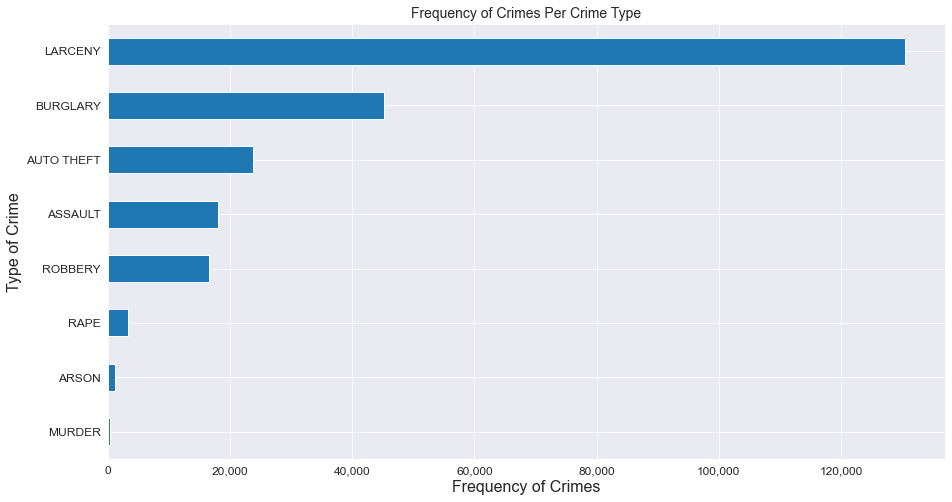

In [16]:
## Plot these for better visualization
crime_type_df = df['Category'].value_counts(ascending=True)

## Some formatting to make it look nicer
fig=plt.figure(figsize=(15, 8))
plt.title("Frequency of Crimes Per Crime Type",fontsize=title_font_size)
plt.xlabel("Frequency of Crimes", fontsize=16)
plt.ylabel("Type of Crime",fontsize=16)
ax = crime_type_df.plot(kind='barh', fontsize=12)
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

## Time Features

- Time features: Hour, Month, Year, DayofWeek
- plot line plot for each of these
- plot a distribution (histogram) for each of these

In [17]:
df["Dates"] = pd.to_datetime(df["Dates"], format="%Y-%m-%d %H:%M:%S")
df["Hour"] = df["Dates"].map(lambda x: x.hour)
df["Month"] = df["Dates"].map(lambda x: x.month)
df["Year"] = df["Dates"].map(lambda x: x.year)

In [18]:
#Loop through temporal features
def lineplot_temporal_feature(df, time_feature, crime_category_names, xaxis_formatter=None, xtick_inc=None):
    
    # Set figure size
    fig = plt.figure(figsize=(50, 100))
    
    for i in range(len(crime_category_names)):
        p = plt.subplot(10, 4, i+1)
        crime = crime_category_names[i]
        cur_crime_data = df[df.Category == crime]
        temporal_data = cur_crime_data[time_feature].value_counts().sort_index()
        sns.lineplot(data=temporal_data)
        if xtick_inc:
            plt.xticks(np.arange(df[time_feature].unique().min(),df[time_feature].unique().max()+1, xtick_inc))
        plt.tick_params(axis = 'both', which = 'major', labelsize = 13)
        if xaxis_formatter:
            p.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: xaxis_formatter(x)))
    #     p.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
        plt.ylabel("Frequency of Crime", fontsize=y_axis_font_size)
        time_feature_str = str(time_feature).capitalize()
        plt.xlabel(time_feature_str, fontsize=x_axis_font_size)
        plt.title("%s (%s)" % (crime, 'per '+ time_feature_str), fontsize=title_font_size)
    

        # f,ax=plt.subplots(1,3,figsize=(20,8))
        # sns.distplot(df[df['Pclass']==1].Fare,ax=ax[0])
        # ax[0].set_title('Fares in Pclass 1')
        # # sns.distplot(df_train[df_train['Pclass']==2].Fare,ax=ax[1])
        # # ax[1].set_title('Fares in Pclass 2')
        # # sns.distplot(df_train[df_train['Pclass']==3].Fare,ax=ax[2])
        # # ax[2].set_title('Fares in Pclass 3')
        # plt.show()


    #fig.savefig('visualizations/%s.png' % time_feature_str, bbox_inches='tight')

In [19]:
#Loop through temporal features
def distplot_temporal_feature(df, time_feature, crime_category_names, xaxis_formatter=None, xtick_inc=None):
    
    # Set figure size
    fig = plt.figure(figsize=(50, 100))
    
    for i in range(len(crime_category_names)):
        p = plt.subplot(10, 4, i+1)
        crime = crime_category_names[i]
        cur_crime_data = df[df.Category == crime]
        temporal_data = cur_crime_data[time_feature].value_counts().sort_index()
        sns.distplot(temporal_data, kde=False, bins= 12)
        if xtick_inc:
            plt.xticks(np.arange(df[time_feature].unique().min(),df[time_feature].unique().max()+1, xtick_inc))
        plt.tick_params(axis = 'both', which = 'major', labelsize = 13)
        if xaxis_formatter:
            #p.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: xaxis_formatter(x)))
            p.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
        plt.ylabel("Frequency of Crime", fontsize=y_axis_font_size)
        time_feature_str = str(time_feature).capitalize()
        plt.xlabel(time_feature_str, fontsize=x_axis_font_size)
        plt.title("%s (%s)" % (crime, 'per '+ time_feature_str), fontsize=title_font_size)

    #fig.savefig('visualizations/%s.png' % time_feature_str, bbox_inches='tight')

### Distribution of Crime over 24 hours

- First plot all crimes over 24 hours
- Then plot per category over 24 hours

In [20]:
def convert_time(hour):
    d = datetime.strptime(str(hour), "%H")
    return d.strftime("%I:%M %p")

In [21]:
## Group dataset by crime occurences and time

# crime_per_time = pd.to_datetime(df['Dates'], format="%Y-%m-%d %H:%M:%S").dt.hour.value_counts().sort_index()
crime_per_time = df["Hour"].value_counts().sort_index()
crime_per_time

0     23148
1      6063
2      7936
3      5869
4      2932
5      3350
6      5360
7      4055
8      8700
9      9982
10     5712
11     8119
12    14998
13     7020
14    10086
15    14329
16     8268
17    13493
18    18088
19     8646
20    13084
21    19167
22     8436
23    11976
Name: Hour, dtype: int64

In [22]:
# # Plot all crimes over the 24 hours
# fig=plt.figure(figsize=(12, 12))

# plt.title("Frequency of Crimes Per 24 Hours", fontsize=20)
# plt.xlabel("Time of Crime", fontsize=16)
# plt.ylabel("Frequency of Crimes", fontsize=16)

# ax = crime_per_time.plot(grid=True, marker='o', color='violet', fontsize=12)

# ax.set_xticks(crime_per_time.index[::3])

# ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: convert_time(x)))
# ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

# #sns.distplot(crime_per_time, ax=ax[0])

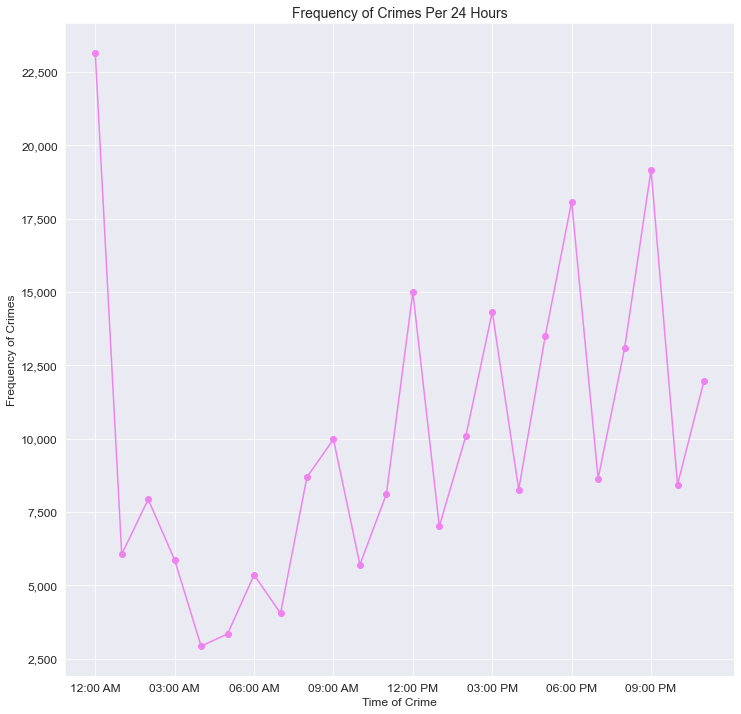

In [23]:
# Plot all crimes over the 24 hours
fig=plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per 24 Hours", fontsize=title_font_size)
plt.xlabel("Time of Crime", fontsize=x_axis_font_size)
plt.ylabel("Frequency of Crimes", fontsize=y_axis_font_size)

ax = crime_per_time.plot(grid=True, marker='o', color='violet', fontsize=12)

ax.set_xticks(crime_per_time.index[::3])

ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: convert_time(x)))
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

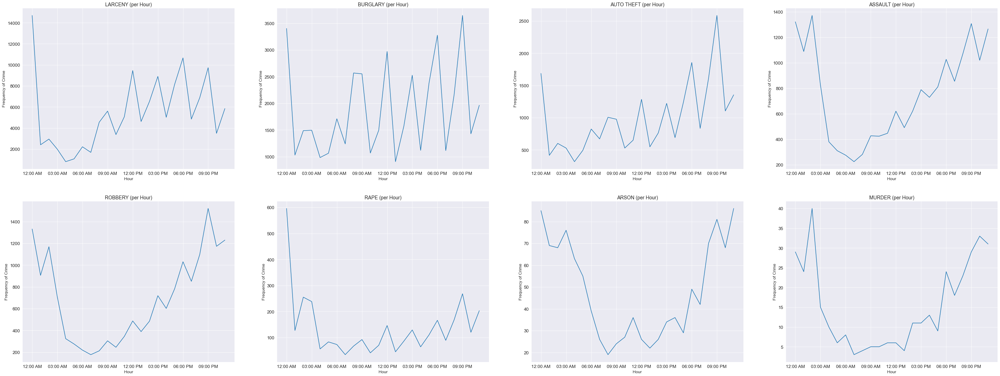

In [24]:
lineplot_temporal_feature(df, 'Hour', crime_category_names, convert_time, xtick_inc=3)

### Distribution of Crime per Month

In [25]:
# crime_per_month = pd.to_datetime(df['Dates'], format="%Y-%m-%d %H:%M:%S").dt.month.value_counts().sort_index()
crime_per_month = df['Month'].value_counts().sort_index()
crime_per_month

1     17576
2     14804
3     17504
4     18261
5     21621
6     22085
7     24470
8     24314
9     21332
10    21049
11    18590
12    17211
Name: Month, dtype: int64

In [26]:
# Used to convert month numbers to month names
import calendar

def convert_month(num):
    return calendar.month_abbr[num]
    

In [27]:
# sns.catplot(x="month", kind="count", palette="ch:.25", data=df)

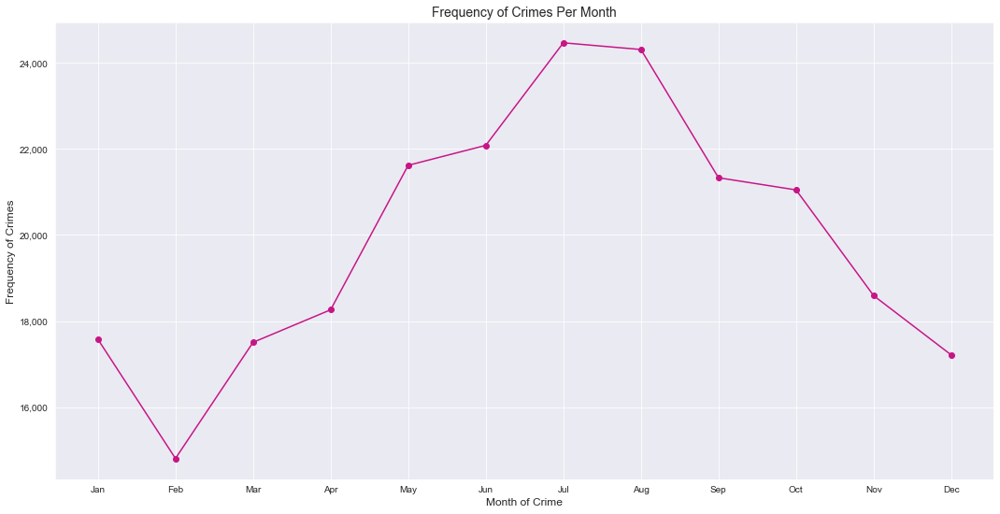

In [28]:
fig = plt.figure(figsize=(18, 9))

plt.title("Frequency of Crimes Per Month", fontsize=title_font_size)
plt.xlabel("Month of Crime", fontsize=x_axis_font_size)
plt.ylabel("Frequency of Crimes", fontsize=y_axis_font_size)

ax = crime_per_month.plot(grid=True, marker='o', color='mediumvioletred')

ax.set_xticks(crime_per_month.index)
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: convert_month(x)))
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))


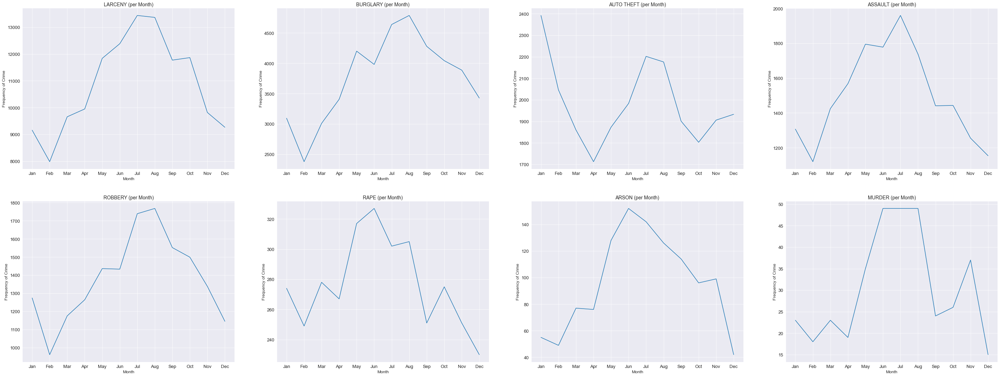

In [29]:
lineplot_temporal_feature(df, 'Month', crime_category_names, convert_month, xtick_inc=1)


### Distribution of Crimes per day of week

In [30]:
## Used to order the categories
df['DayOfWeek'] = pd.Categorical(df['DayOfWeek'], 
                                 categories=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'], 
                                 ordered=True)


crime_per_day = df['DayOfWeek'].value_counts().sort_index()
crime_per_day.index.values

['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
Categories (7, object): ['Monday' < 'Tuesday' < 'Wednesday' < 'Thursday' < 'Friday' < 'Saturday' < 'Sunday']

In [31]:
crime_per_day

Monday       33904
Tuesday      33144
Wednesday    33354
Thursday     33183
Friday       36711
Saturday     35748
Sunday       32773
Name: DayOfWeek, dtype: int64

[Text(0, 0, 'Monday'),
 Text(1, 0, 'Tuesday'),
 Text(2, 0, 'Wednesday'),
 Text(3, 0, 'Thursday'),
 Text(4, 0, 'Friday'),
 Text(5, 0, 'Saturday'),
 Text(6, 0, 'Sunday')]

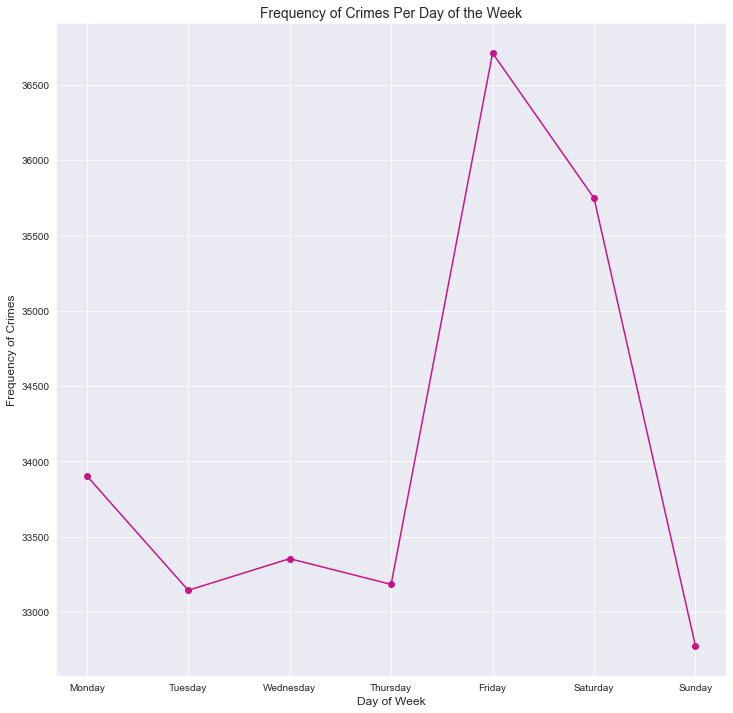

In [32]:
fig = plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per Day of the Week", fontsize=title_font_size)
plt.xlabel("Day of Week", fontsize=x_axis_font_size)
plt.ylabel("Frequency of Crimes", fontsize=y_axis_font_size )

#ax = crime_per_day.plot(kind='bar', color='mediumvioletred')
ax = crime_per_day.plot(grid=True, marker='o', color='mediumvioletred')

# Quick Note for string X tick labels:
# .set_xticks() on the axes will set the locations and set_xticklabels() will set the displayed text.
ax.set_xticks([0, 1, 2, 3, 4, 5, 6])
ax.set_xticklabels(crime_per_day.index)

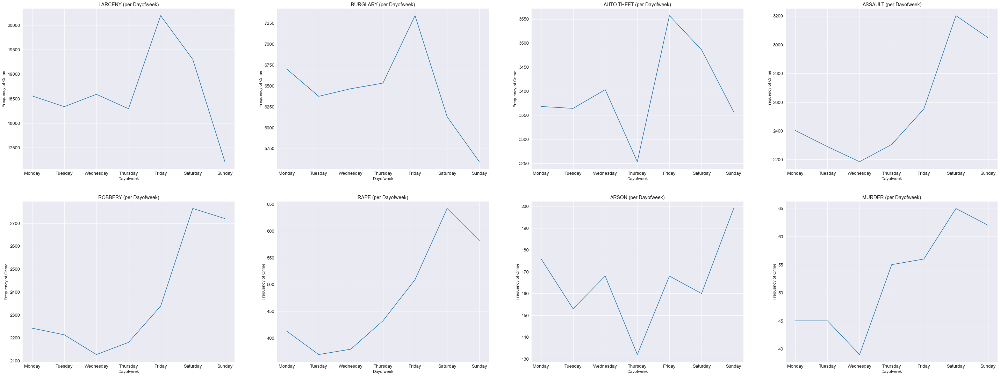

In [33]:
lineplot_temporal_feature(df, 'DayOfWeek', crime_category_names, None, None)

### Distribution of Crimes per Year

In [34]:
crime_per_year = df["Year"].value_counts().sort_index()
crime_per_year

2010    20541
2011    21684
2012    21937
2013    21720
2014    21497
2015    19960
2016    20059
2017    21628
2018    17122
2019    20139
2020    20765
2021    11765
Name: Year, dtype: int64

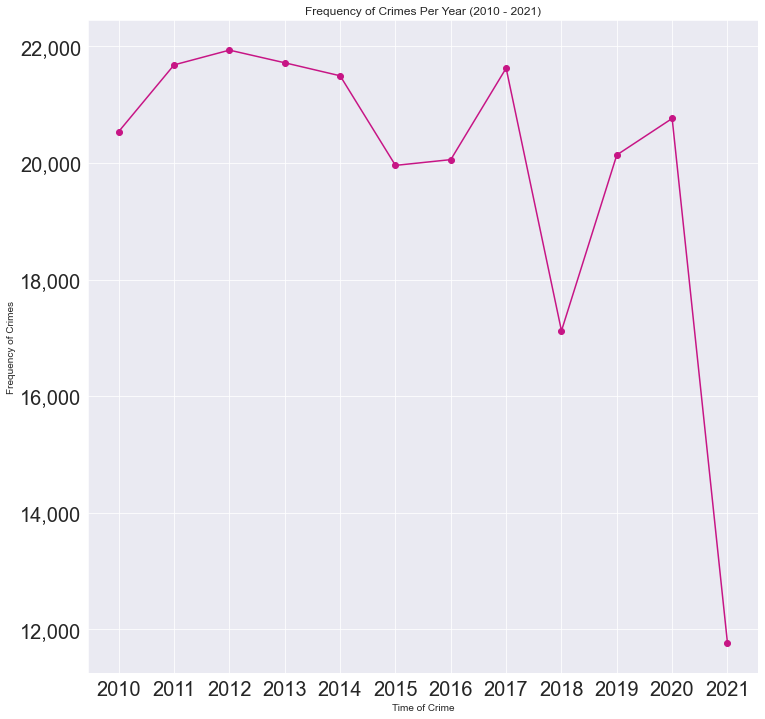

In [35]:
# Plot all crimes over the 24 hours
fig=plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per Year (2010 - 2021)")
plt.xlabel("Time of Crime")
plt.ylabel("Frequency of Crimes")

ax = crime_per_year.plot(grid=True, marker='o', color='mediumvioletred', fontsize=20)

ax.set_xticks(crime_per_year.index)

ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

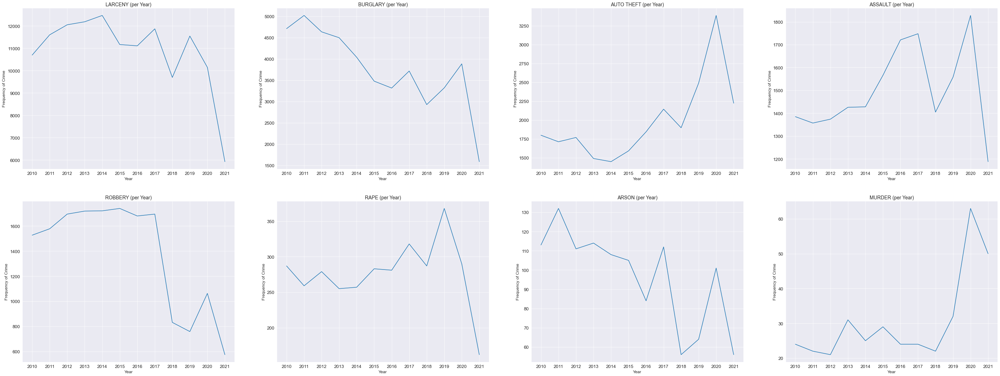

In [36]:
lineplot_temporal_feature(df, 'Year', crime_category_names, None, xtick_inc=1)

## Histogram Plots

- plot distributions of each crime using histograms and seaborn's `FacetGrid`

In [37]:
# Set up some seaborn parameters
sns.set(font_scale=2.5)

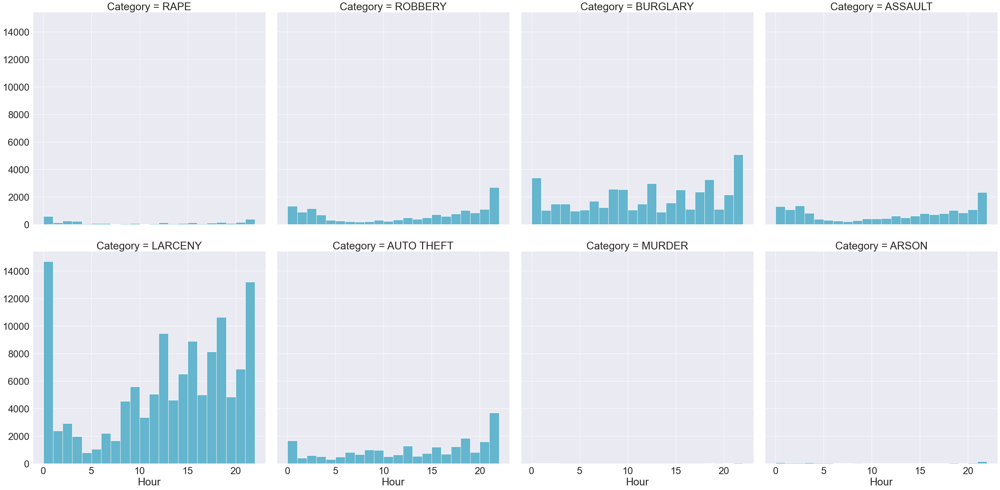

In [38]:
g = sns.FacetGrid(df, col="Category", col_wrap=4, height=10)
g = g.map(plt.hist, "Hour", bins=np.arange(0, 23), color="c")

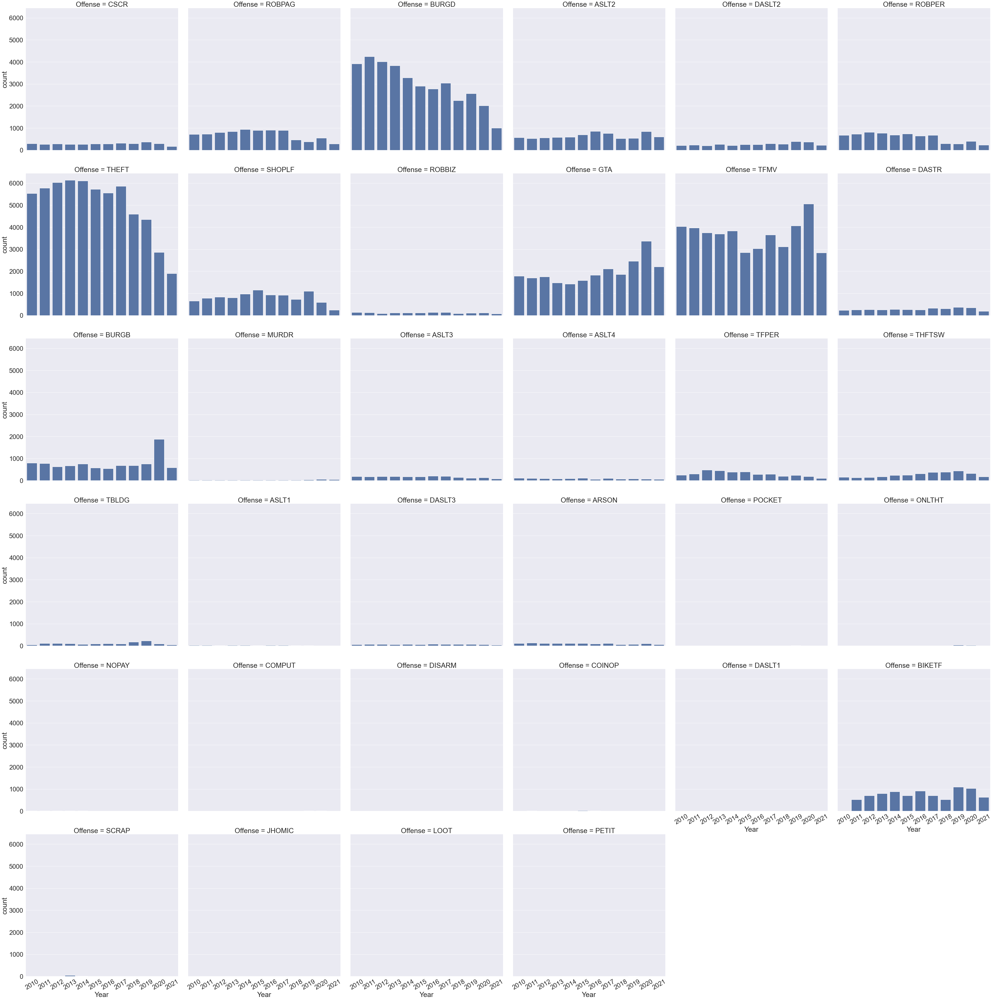

In [39]:
g = sns.FacetGrid(df, col="Offense", col_wrap=6, height=10)
g = g.map(sns.countplot, "Year", order=np.sort(df['Year'].unique()))
g.set_xticklabels(rotation=30)

In [40]:
# # Count of offenses per month
# g = sns.FacetGrid(df, col="Offense", col_wrap=6, height=10)
# g = g.map(sns.countplot, "Month", order=np.sort(df['Month'].unique()))

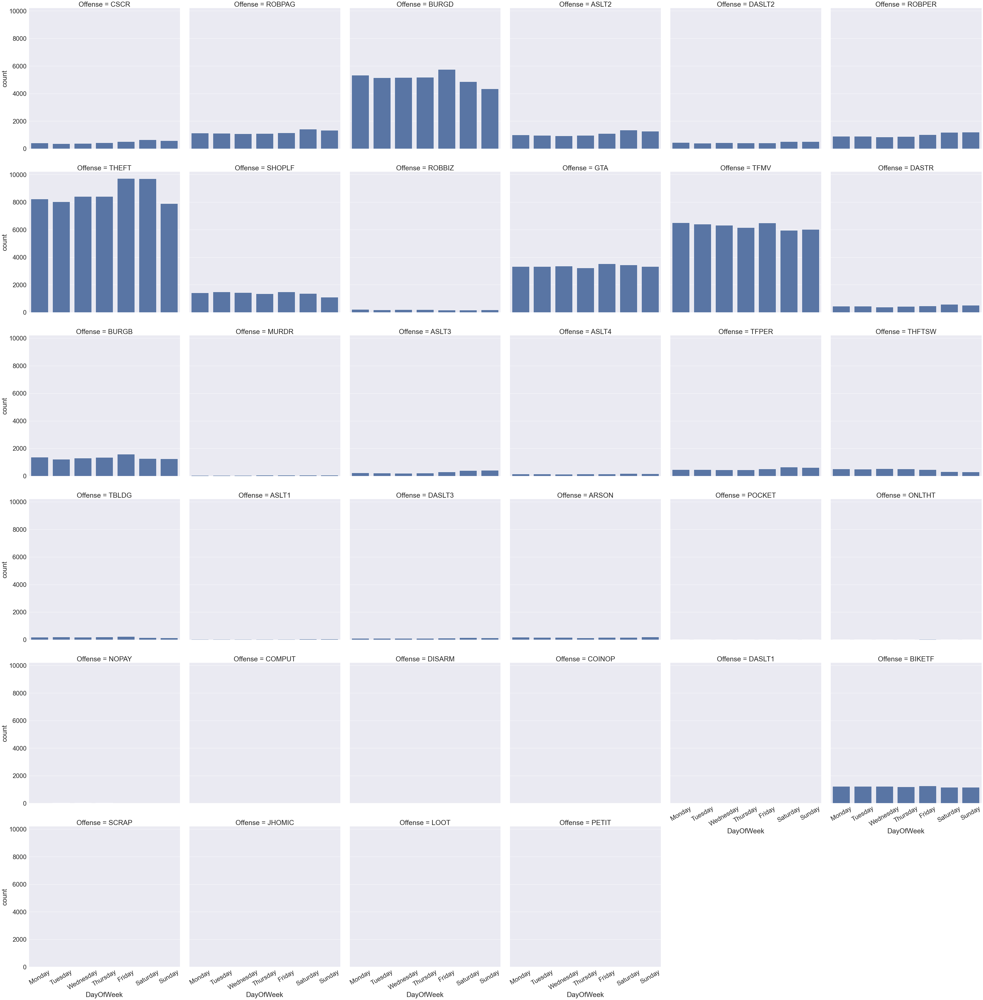

In [41]:
g = sns.FacetGrid(df, col="Offense", col_wrap=6, height=10)
g = g.map(sns.countplot, "DayOfWeek", order=df['DayOfWeek'].sort_values().unique())
g.set_xticklabels(rotation=30)

# Spatial Features

In [42]:
def plot_long_lat_map(df, crime_category_names):
    
    # Set figure size
    fig = plt.figure(figsize=(50, 100))
    
    for i in range(len(crime_category_names)):
        p = plt.subplot(10, 4, i+1)
        crime = crime_category_names[i]
        cur_crime_data = df[df.Category == crime]
        plt.title(crime + " locations")
        p.scatter(cur_crime_data.Long, cur_crime_data.Lat, alpha = 0.01)
        plt.xlabel("Longitude", fontsize=25)
        plt.ylabel('Latitude', fontsize=25)
#         p.set_xticklabels(rotation=30)
        plt.title("%s %s" % (crime, 'locations'), fontsize=30)
    
    #fig.savefig('visualizations/minneapolis_crime_locations_per_category_map.png', bbox_inches='tight')

### Distribution of Crime Per Precinct
- plot all crimes with a barplot.
- plot specific categories of crime with a heatplot.

In [43]:
crime_per_pd = df['Precinct'].value_counts()
crime_per_pd

SOUTHEAST    64770
SOUTHWEST    48619
NORTH        46345
DOWNTOWN     44903
NORTHEAST    34180
Name: Precinct, dtype: int64

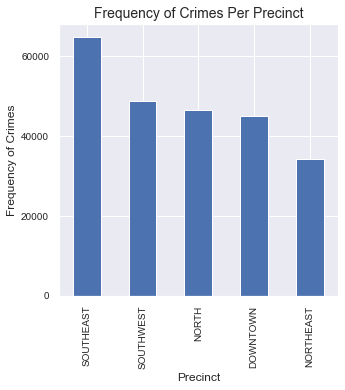

In [44]:
fig=plt.figure(figsize=(5, 5))

plt.title("Frequency of Crimes Per Precinct", fontsize=title_font_size)
plt.xlabel("Precinct", fontsize=x_axis_font_size)
plt.ylabel("Frequency of Crimes", fontsize=y_axis_font_size)

#plt.xlabel.set_xticklabels(rotation=30)

ax = crime_per_pd.plot(kind='bar',fontsize=10)


### Distribution of Crime Per Neighborhood
- plot all crimes with a barplot.
- plot specific categories of crime with a heatplot.

In [45]:
crime_per_nh = df['Neighborhood'].value_counts()
crime_per_nh

DOWNTOWN WEST                      24690
WHITTIER                           10179
MARCY HOLMES                        7474
LONGFELLOW                          7060
JORDAN                              6956
LOWRY HILL EAST                     6293
NEAR - NORTH                        6243
LORING PARK                         5417
HAWTHORNE                           5338
POWDERHORN PARK                     5254
WILLARD - HAY                       5247
SEWARD                              4938
VENTURA VILLAGE                     4706
ELLIOT PARK                         4632
MIDTOWN PHILLIPS                    4537
CENTRAL                             4464
FOLWELL                             4399
NORTH LOOP                          4393
LYNDALE                             4158
EAST PHILLIPS                       4026
CEDAR RIVERSIDE                     3891
PROSPECT PARK - EAST RIVER ROAD     3883
WEBBER - CAMDEN                     3561
CARAG                               3406
COMO            

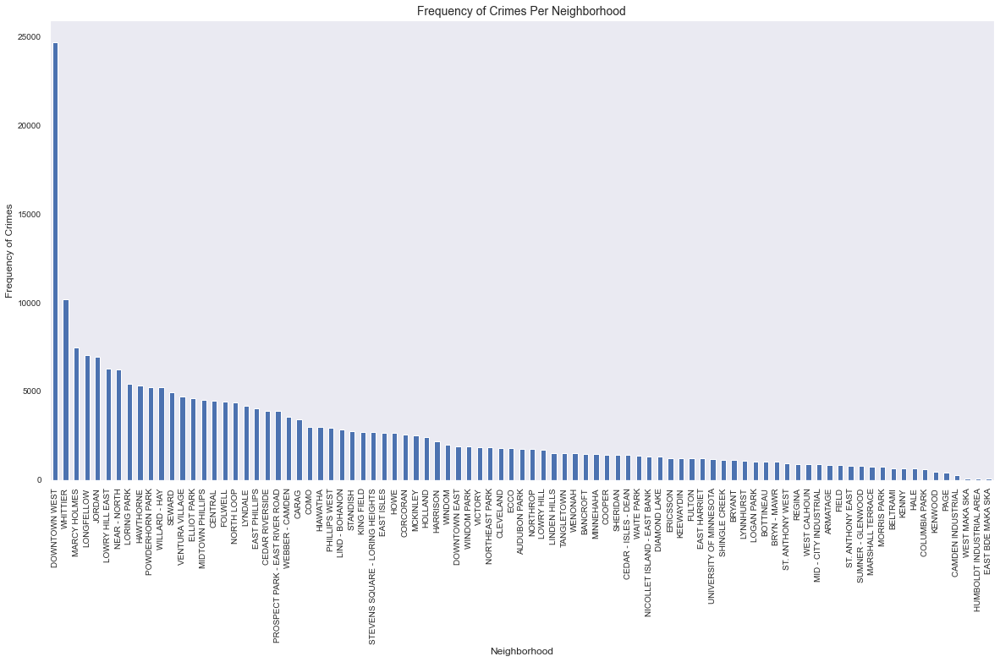

In [46]:
fig=plt.figure(figsize=(20, 10))

plt.title("Frequency of Crimes Per Neighborhood", fontsize=title_font_size)
plt.xlabel("Neighborhood", fontsize=x_axis_font_size)
plt.ylabel("Frequency of Crimes", fontsize=y_axis_font_size)

ax = crime_per_nh.plot(kind='bar',fontsize=10, grid=False)

#fig.savefig('visualizations/Neighborhood_barplot.png', bbox_inches='tight')

In [ ]:
#sns.heatmap(df.corr(),annot=True,cmap='RdYlGn',linewidths=0.2)
#fig=plt.gcf()
#fig.set_size_inches(10,8)
#plt.show()
#df.drop(['Name','Age','Ticket','Fare','Cabin','PassengerId'],axis=1,inplace=True)
sns.heatmap(df.corr(), cmap='coolwarm', annot=True)#, fmt=".1f")

#ax.font
# fig, ax = sns.heatmap(figsize=(10,10))
# sns.set(font_scale=.2)
# sns.heatmap(df.corr(),annot=True, ax=ax)
# plt.show()

In [48]:
# categories = df['Category'].unique()
# precincts = df['Precinct'].unique()
# tarray = []
# for cat in categories:
#     sub_array = []
#     for prec in precincts:
#         sub_array.append(len(df[(df['Precinct'] == prec) & (df['Category'] == cat)]))
#     tarray.append(sub_array)

# fig, ax = plt.subplots(1, 1, figsize =(12,9))
# #fig, ax = plt.plot(figsize =(12,9))
# heat_df = pd.DataFrame(tarray, index=categories, columns=precincts)
# sns.heatmap(heat_df, cmap='Blues')

# fig.savefig('visualizations/Precinct_per_crime_category_heatmap.png', bbox_inches='tight')

In [ ]:
categories = df['Category'].unique()
hoods = df['Neighborhood'].unique()
tarray = []
for cat in categories:
    sub_array = []
    for hood in hoods:
        sub_array.append(len(df[(df['Neighborhood'] == hood) & (df['Category'] == cat)]))
    tarray.append(sub_array)

fig, ax = plt.subplots(1, 1, figsize =(10,20))
heat_df = pd.DataFrame(tarray, index=categories, columns=hoods)
sns.heatmap(heat_df, cmap='coolwarm')

#fig.savefig('visualizations/Neighborhood_per_crime_category_heatmap.png', bbox_inches='tight')

## Data Visualization with Maps & Density Plots

### Map Visualization from Long & Lat coordinates

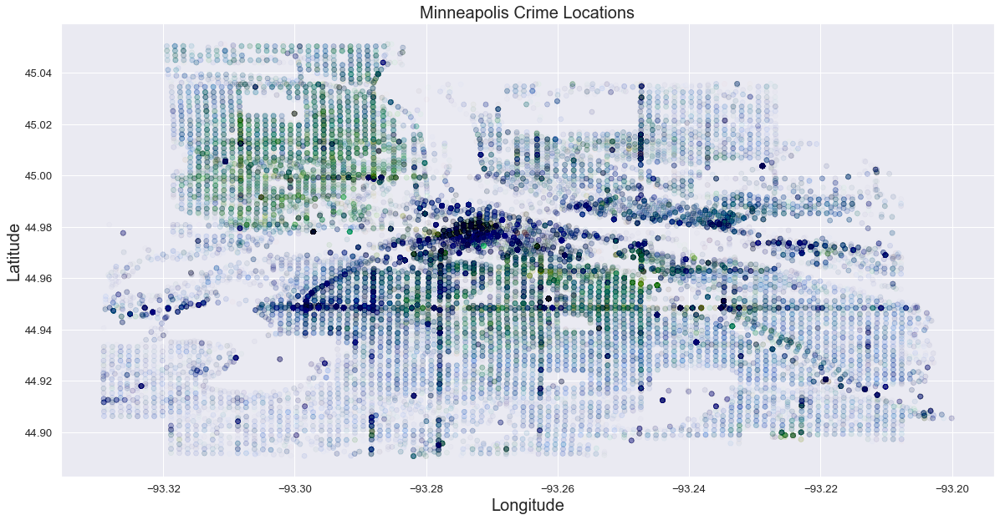

In [58]:
# Let's drop the outlier for now, since it is skewing our visualization
df.drop(df[df['Long'] == df['Long'].max()].index, inplace=True)

# Assign a color index to each crime category
color_map = dict(zip(crime_category_names, range(len(crime_categories))))

# Draw a scatter plot to show the crimes distribution
fig = plt.figure(figsize=(20,10))
plt.scatter(df.Long, df.Lat, c=df.Category.map(color_map), cmap=plt.cm.gist_ncar, alpha = 0.01)
plt.title("Minneapolis Crime Locations", fontsize=20)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)

fig.savefig('visualizations/minneapolis_crime_locations_map.png', bbox_inches='tight')

In [51]:
df = df[['Dates', 'Category', 'Description', 'DayOfWeek', 'Precinct', 'Address', 'Long', 'Lat', 'Hour', 'Month', 'Year']]

In [56]:
# Plot interactive map for visualization
crimes_map = folium.Map(location=[df['Lat'].mean(), df['Long'].mean()], zoom_start=10)
marker_cluster = MarkerCluster().add_to(crimes_map)

for row in df.values[:5000]:
    popup = "<br> Crime Type: " + row[1] + "<br> Crime Description: " + row[2] + "<br> Date/Time: " + str(row[0])   + "<br> Address: " + row[5] + "</p>"
    folium.Marker([row[7], row[6]], popup=popup).add_to(marker_cluster)

#crimes_map.save('Minneapolis-All-Crimes-Map.html')
crimes_map

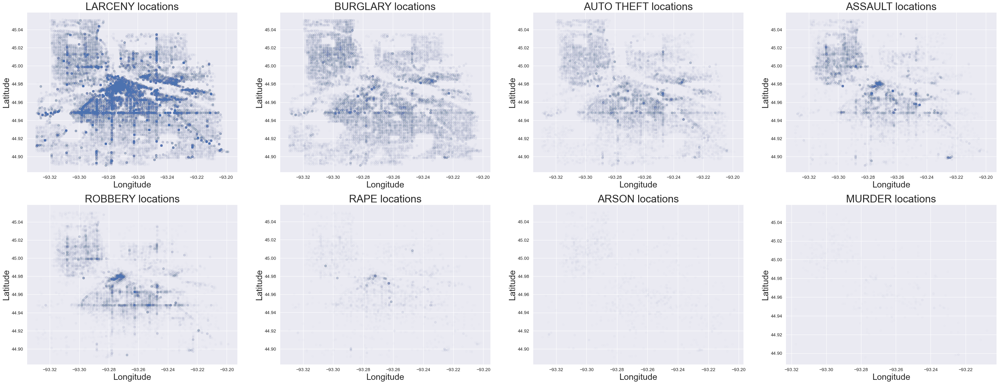

In [53]:
sns.set(font_scale=1.2)
plot_long_lat_map(df, crime_category_names)

# Summary

- Temporal Features
    - Certain categories of crimes have certain occurences temporally
        - based on `Year`, `DayOfWeek`, `Month`, `Hour`
- Spatial Features
    - Certain categories of crime have higher occurences and density in certain areas
        - based on Longitude & Latitude, and `Neighborhood`